# October 12th, 2021

**Motivation**: Same as Oct 11, but for nn = 768, and a better cleaner function to accept regions <br>

In [1]:
# HIDE CODE


import os
import sys
import nibabel as nib
import networkx as nx
from time import time
from pprint import pprint
from copy import deepcopy as dc
from os.path import join as pjoin
from myterial import orange, blue_grey
from IPython.display import display, IFrame, HTML
from matplotlib.colors import rgb2hex, to_rgb
import matplotlib.pyplot as plt
import seaborn as sns

# set style & no interpolalation
import matplotlib
matplotlib.rcParams['image.interpolation'] = 'none'
sns.set_style('whitegrid')

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
tmp_dir = pjoin(git_dir, 'jb-Ca-fMRI/tmp')
extras_dir = pjoin(git_dir, 'jb-Ca-fMRI/_extras')
lfr_dir = pjoin(os.environ['HOME'], 'Documents/workspaces/lfr/binary_overlapping')


# GitHub
sys.path.insert(0, pjoin(git_dir, '_Ca-fMRI'))
from register.atlas import Allen
from register.parcellation import Parcellation
from analysis.hierarchical import Hierarchical
from analysis.bootstrap import *
from analysis.svinet import *
from analysis.group import *
from analysis.lfr import *
from utils.render import *
from utils.plotting import *
from model.mouse import Mice
from model.configuration import Config

# warnings
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

In [2]:
from register.register import ants, reset_ants_img

## 768 * 4

In [3]:
mice = Mice(Config(768, 4, 100), load_preproc=True, load_allen=True, load_parcel=True)

In [4]:
mice.parcel.fill_rois_2d()

### Load one individual Ca

In [5]:
key = 'sub-SLC08_ses-2'

mask = mice.mask2d[key].load_ants('unsigned int')

roi_2d = ants.image_read(
    filename=pjoin(mice.cfg.masks_dir, f"{key}_space-indiv2d_cortex-merged.nii.gz"),
    pixeltype='unsigned int',
)
roi_2d = reset_ants_img(roi_2d.numpy().squeeze(), spacing=roi_2d.spacing[:2], origin=0, use_um=False)

ref = mice.ref[key].load_ants('float')
ref = reset_ants_img(ref.numpy().squeeze(), spacing=ref.spacing[:2], origin=0, use_um=False)

roi_2d = ants.resample_image_to_target(roi_2d, mask, interp_type='genericLabel')
ref = ants.resample_image_to_target(ref, mask, interp_type='linear')

roi_2d *= mask
ref *= mask

<matplotlib.image.AxesImage object at 0x7e83a4ae15e0>

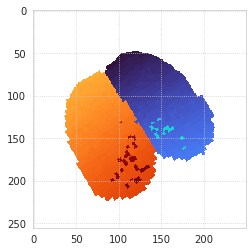

In [6]:
roi_2d_np = roi_2d.numpy().astype(int).squeeze()
regions2d = np.unique(roi_2d_np[roi_2d_np.nonzero()])

roi_2d_np = roi_2d_np.astype(float)
roi_2d_np[roi_2d_np == 0] = np.nan

plt.imshow(roi_2d_np, cmap='turbo')

In [7]:
len(regions2d)

842

In [8]:
hcl = mice.parcel.decode(regions2d)
regions_l = regions2d[hcl[:, 0] == 1]
regions_r = regions2d[hcl[:, 0] == 2]

<matplotlib.colorbar.Colorbar object at 0x7e837c9a09a0>

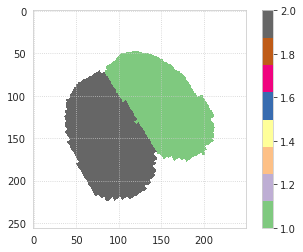

In [9]:
x = roi_2d_np.copy()
x[np.isin(x, regions_l)] = 1
x[np.isin(x, regions_r)] = 2
plt.imshow(x, cmap='Accent')
plt.colorbar()

In [10]:
sizes = collections.Counter(roi_2d_np[~np.isnan(roi_2d_np)])
sizes_np = np.array(list(sizes.values()))

In [11]:
min(sizes_np)

1

<AxesSubplot:ylabel='Count'>

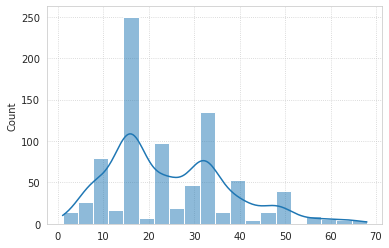

In [12]:
sns.histplot(sizes_np, kde=True)

### Load all compare

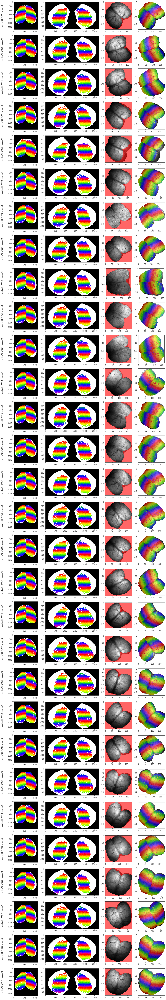

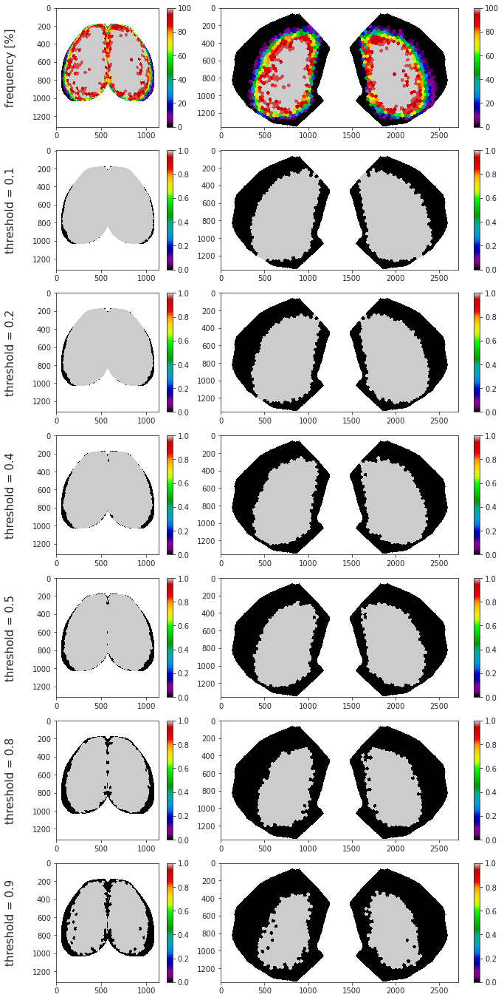

accept ratio: 72 %, reject ratio: 28 %, using a presence threshold of 10.0 %
a total of 1020 regions were accepted

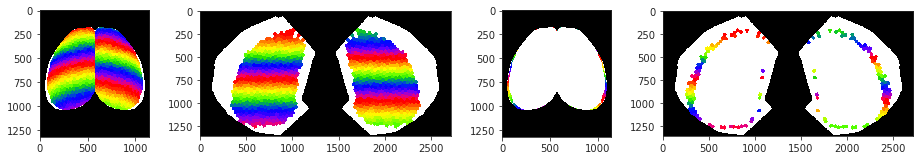

In [13]:
output = mice.parcel.get_accepted_regions(mice, 0.1)

<matplotlib.lines.Line2D object at 0x7e834dd7bc70>

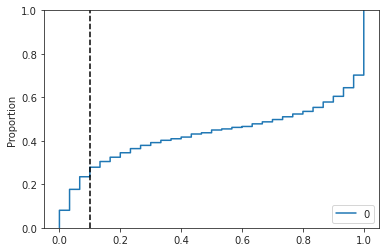

In [14]:
sns.ecdfplot(output['freq'].values())
plt.axvline(0.1, color='k', ls='--')

## 128 * 2

In [18]:
mice = Mice(Config(128, 2, 100), load_preproc=True, load_allen=True, load_parcel=True)

In [19]:
mice.parcel.fill_rois_2d()

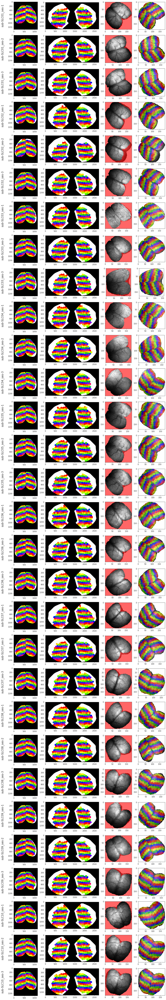

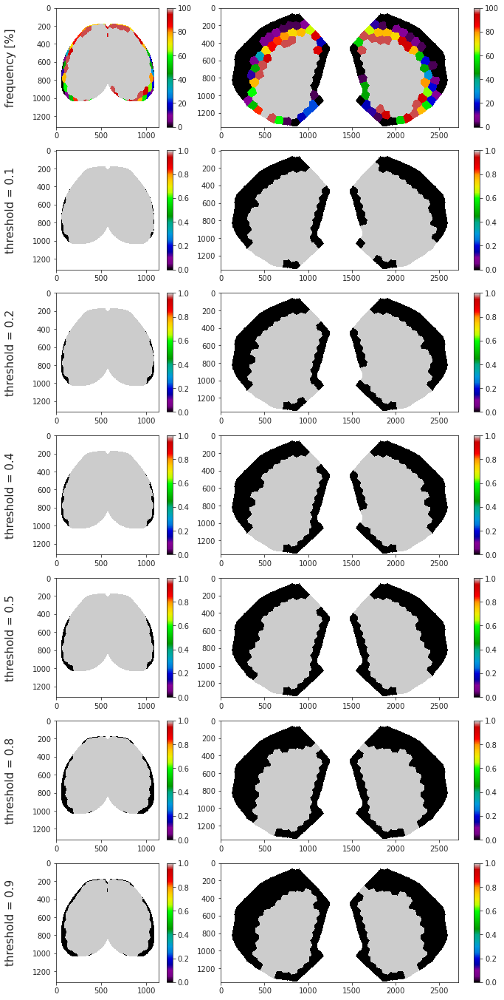

accept ratio: 85 %, reject ratio: 15 %, using a presence threshold of 10.0 %
a total of 176 regions were accepted

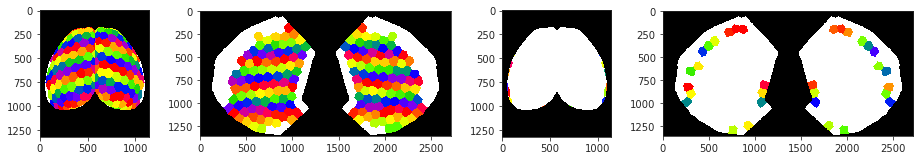

In [20]:
output = mice.parcel.get_accepted_regions(mice, 0.1)

<matplotlib.lines.Line2D object at 0x7e834daf8310>

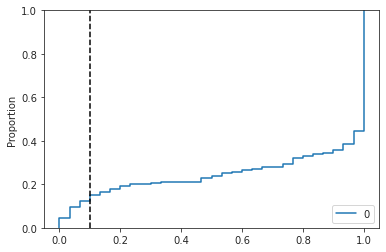

In [21]:
sns.ecdfplot(output['freq'].values())
plt.axvline(0.1, color='k', ls='--')

## Old stuff below (left right check)

In [21]:
flat = pjoin(mice.cfg.main_dir, 'parcel2d-flat_10um.nii.gz')
flat = ants.image_read(flat, pixeltype='unsigned int').numpy()
top = pjoin(mice.cfg.main_dir, 'parcel2d-top_10um.nii.gz')
top = ants.image_read(top, pixeltype='unsigned int').numpy()

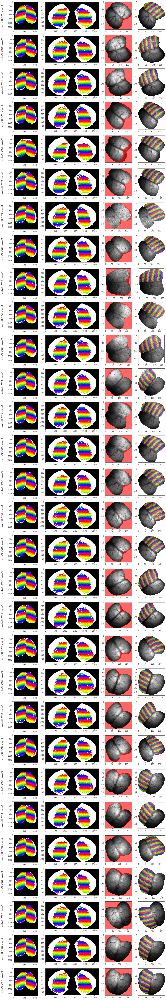

In [18]:
nrows = 30
fig, axes = create_figure(nrows, 4, (13, 2.6 * nrows), gridspec_kw={'width_ratios': [1, 2, 1, 1]})

for ii, key in enumerate(mice.ref):
    roi_2d = pjoin(mice.cfg.masks_dir, f"{key}_space-indiv2d_cortex-merged.nii.gz")
    roi_2d = ants.image_read(filename=roi_2d, pixeltype='unsigned int')
    roi_2d = reset_ants_img(roi_2d.numpy().squeeze(), spacing=roi_2d.spacing[:2], origin=0, use_um=False)

    ref = mice.ref[key].load_ants('float')
    ref = reset_ants_img(ref.numpy().squeeze(), spacing=ref.spacing[:2], origin=0, use_um=False)

    mask = mice.mask2d[key].load_ants('unsigned int')
    roi_2d = ants.resample_image_to_target(roi_2d, mask, interp_type='genericLabel')
    ref = ants.resample_image_to_target(ref, mask, interp_type='linear')
    roi_2d *= mask
    ref *= mask

    roi_2d_np = roi_2d.numpy().astype(int).squeeze()
    regions2d = np.unique(roi_2d_np[roi_2d_np.nonzero()])
    hcl = mice.parcel.decode(regions2d)

    ref_tr, roi_tr, mask_tr = filter_boundaries(
        [ref.numpy(), roi_2d.numpy(), mask.numpy()], mask.numpy())
    ref_tr = ref_tr.astype(float)
    roi_tr = roi_tr.astype('uint32')
    mask_tr = mask_tr.astype(bool)
    
    axes[ii, 0].set_ylabel(f"{key}\n", fontsize=15)

    data2plt = np.ma.masked_where(~np.isin(top, regions2d), top)
    axes[ii, 0].imshow(top > 0, cmap='Greys_r')
    axes[ii, 0].imshow(data2plt, cmap='prism')

    data2plt = np.ma.masked_where(~np.isin(flat, regions2d), flat)
    axes[ii, 1].imshow(flat > 0, cmap='Greys_r')
    axes[ii, 1].imshow(data2plt, cmap='prism')

    axes[ii, 2].imshow(np.ma.masked_where(~mask_tr, ref_tr), cmap='Greys_r')
    axes[ii, 2].imshow(np.ma.masked_where(roi_tr.astype(bool), roi_tr), alpha=0.6, cmap='prism')

    regions_r = regions2d[hcl[:, 0] == 2]
    roi_tr[np.isin(roi_tr, regions_r)] = 0
    
    axes[ii, 3].imshow(np.ma.masked_where(~mask_tr, ref_tr), cmap='Greys_r')
    axes[ii, 3].imshow(np.ma.masked_where(~roi_tr.astype(bool), roi_tr), alpha=0.6, cmap='prism')

plt.show()

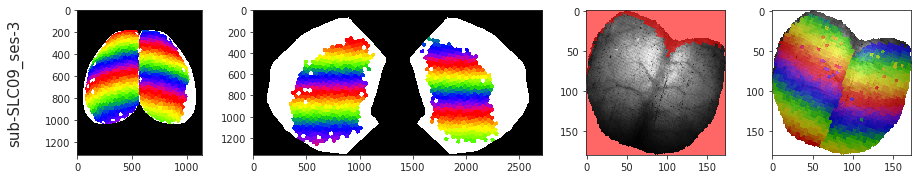

In [19]:
nrows = 1
fig, axes = create_figure(
    nrows, 4, (13, 2.6 * nrows),
    gridspec_kw={'width_ratios': [1, 2, 1, 1]}, reshape=True)

key = 'sub-SLC09_ses-3'

roi_2d = pjoin(mice.cfg.masks_dir, f"{key}_space-indiv2d_cortex-merged.nii.gz")
roi_2d = ants.image_read(filename=roi_2d, pixeltype='unsigned int')
roi_2d = reset_ants_img(roi_2d.numpy().squeeze(), spacing=roi_2d.spacing[:2], origin=0, use_um=False)

ref = mice.ref[key].load_ants('float')
ref = reset_ants_img(ref.numpy().squeeze(), spacing=ref.spacing[:2], origin=0, use_um=False)

mask = mice.mask2d[key].load_ants('unsigned int')
roi_2d = ants.resample_image_to_target(roi_2d, mask, interp_type='genericLabel')
ref = ants.resample_image_to_target(ref, mask, interp_type='linear')
roi_2d *= mask
ref *= mask

roi_2d_np = roi_2d.numpy().astype(int).squeeze()
regions2d = np.unique(roi_2d_np[roi_2d_np.nonzero()])
hcl = mice.parcel.decode(regions2d)

ref_tr, roi_tr, mask_tr = filter_boundaries(
    [ref.numpy(), roi_2d.numpy(), mask.numpy()], mask.numpy())
ref_tr = ref_tr.astype(float)
roi_tr = roi_tr.astype('uint32')
mask_tr = mask_tr.astype(bool)

axes[0, 0].set_ylabel(f"{key}\n", fontsize=15)

data2plt = np.ma.masked_where(~np.isin(top, regions2d), top)
axes[0, 0].imshow(top > 0, cmap='Greys_r')
axes[0, 0].imshow(data2plt, cmap='prism')

data2plt = np.ma.masked_where(~np.isin(flat, regions2d), flat)
axes[0, 1].imshow(flat > 0, cmap='Greys_r')
axes[0, 1].imshow(data2plt, cmap='prism')

axes[0, 2].imshow(np.ma.masked_where(~mask_tr, ref_tr), cmap='Greys_r')
axes[0, 2].imshow(np.ma.masked_where(roi_tr.astype(bool), roi_tr), alpha=0.6, cmap='prism')

axes[0, 3].imshow(np.ma.masked_where(~mask_tr, ref_tr), cmap='Greys_r')
axes[0, 3].imshow(np.ma.masked_where(~roi_tr.astype(bool), roi_tr), alpha=0.6, cmap='prism')

plt.show()

In [20]:
roi_2d = pjoin(mice.cfg.masks_dir, f"{key}_space-indiv2d_cortex-merged.nii.gz")
roi_2d = ants.image_read(filename=roi_2d, pixeltype='unsigned int')

x = roi_2d.numpy().squeeze()
regions2d = np.unique(x[x.nonzero()])
hcl = mice.parcel.decode(regions2d)

regions_l = regions2d[hcl[:, 0] == 1]
regions_r = regions2d[hcl[:, 0] == 2]

x_r = x.copy()
x_r[np.isin(x, regions_l)] = 0

x_l = x.copy()
x_l[np.isin(x, regions_r)] = 0

Text(0.5, 1.0, 'x_r')

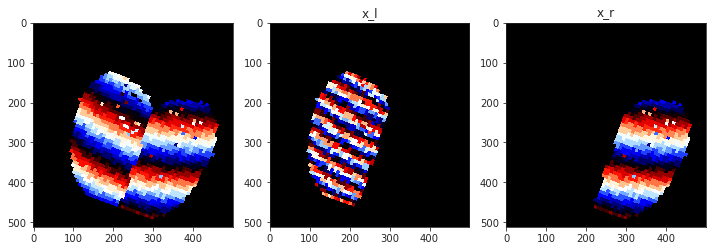

In [21]:
fig, axes = create_figure(1, 3, (10, 4))
axes[0].imshow(x, cmap='flag_r')
axes[1].imshow(x_l, cmap='flag_r')
axes[1].set_title('x_l')
axes[2].imshow(x_r, cmap='flag_r')
axes[2].set_title('x_r')

In [22]:
roi_2d

ANTsImage (RAI)
         Pixel Type : unsigned int (uint32)
         Components : 1
         Dimensions : (512, 500, 1)
         Spacing    : (0.025, 0.025, 0.025)
         Origin     : (6.4, -6.2, -7.8)
         Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [23]:
x_r = reset_ants_img(
    img=np.expand_dims(x_r, axis=-1),
    spacing=roi_2d.spacing,
    origin=roi_2d.origin,
    use_um=False,
)
x_r

ANTsImage (RAI)
         Pixel Type : unsigned int (uint32)
         Components : 1
         Dimensions : (512, 500, 1)
         Spacing    : (0.025, 0.025, 0.025)
         Origin     : (6.4, -6.2, -7.8)
         Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [24]:
x_l = reset_ants_img(
    img=np.expand_dims(x_l, axis=-1),
    spacing=roi_2d.spacing,
    origin=roi_2d.origin,
    use_um=False,
)
x_l

ANTsImage (RAI)
         Pixel Type : unsigned int (uint32)
         Components : 1
         Dimensions : (512, 500, 1)
         Spacing    : (0.025, 0.025, 0.025)
         Origin     : (6.4, -6.2, -7.8)
         Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [25]:
ants.image_write(x_l, pjoin(tmp_dir, f"{key}_cortical_left.nii.gz"))
ants.image_write(x_r, pjoin(tmp_dir, f"{key}_cortical_right.nii.gz"))

In [26]:
cmap = sns.color_palette('turbo', as_cmap=True)

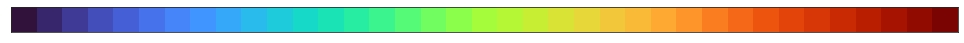

In [27]:
display_cmap(cmap)

In [28]:
regions_agg = []
for item in regions_all.values():
    regions_agg += item
freq = collections.Counter(regions_agg)
freq = {i: 100 * v / 30 for i, v in freq.items()}

freq_top = np.zeros(top.shape)
freq_flat = np.zeros(flat.shape)

for i, val in freq.items():
    freq_top[top == i] = val
    freq_flat[flat == i] = val

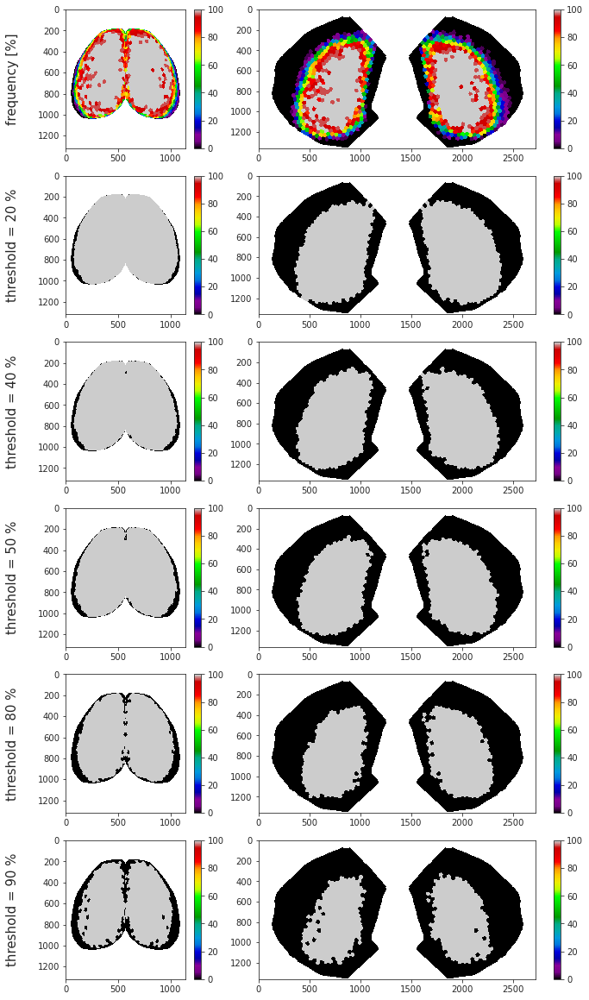

In [29]:
nrows = 6
fig, axes = create_figure(nrows, 2, (10, 2.7 * nrows), gridspec_kw={'width_ratios': [1, 2]})

axes[0, 0].set_ylabel('frequency [%]\n', fontsize=15)

data2plt = np.ma.masked_where(~top.astype(bool), freq_top)
im = axes[0, 0].imshow(data2plt, cmap='nipy_spectral')
plt.colorbar(im, ax=axes[0, 0])

data2plt = np.ma.masked_where(~flat.astype(bool), freq_flat)
im = axes[0, 1].imshow(data2plt, cmap='nipy_spectral')
plt.colorbar(im, ax=axes[0, 1])

for i, th in enumerate([20, 40, 50, 80, 90], start=1):
    axes[i, 0].set_ylabel(f"threshold = {th:d} %\n", fontsize=15)
    
    x = freq_top.copy()
    x[x > th] = 100.
    x[x <= th] = 0.
    data2plt = np.ma.masked_where(~top.astype(bool), x)
    im = axes[i, 0].imshow(data2plt, cmap='nipy_spectral')
    plt.colorbar(im, ax=axes[i, 0])

    x = freq_flat.copy()
    x[x > th] = 100.
    x[x <= th] = 0.
    data2plt = np.ma.masked_where(~flat.astype(bool), x)
    im = axes[i, 1].imshow(data2plt, cmap='nipy_spectral')
    plt.colorbar(im, ax=axes[i, 1])

plt.show()

In [30]:
len(freq)

1300

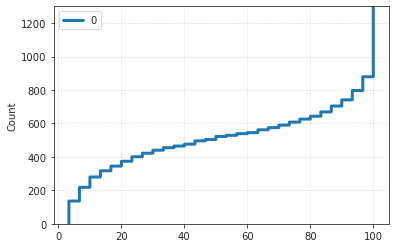

In [31]:
sns.ecdfplot(freq.values(), stat='count', lw=3)
plt.grid()

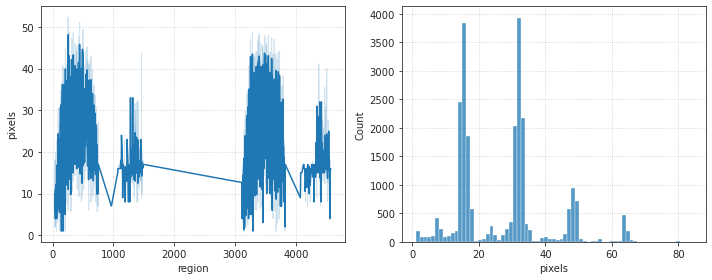

In [32]:
fig, axes = create_figure(1, 2, (10, 4))

sns.lineplot(data=df_sz, x='region', y='pixels', ax=axes[0])
sns.histplot(data=df_sz, x='pixels', ax=axes[1])
for ax in axes.ravel():
    ax.grid()

plt.show()

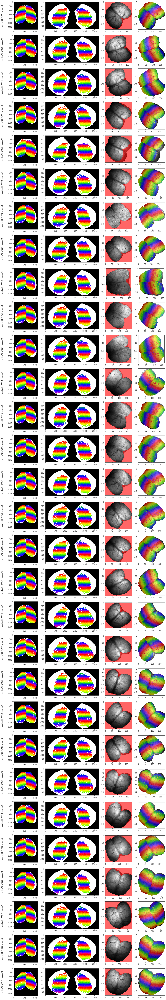

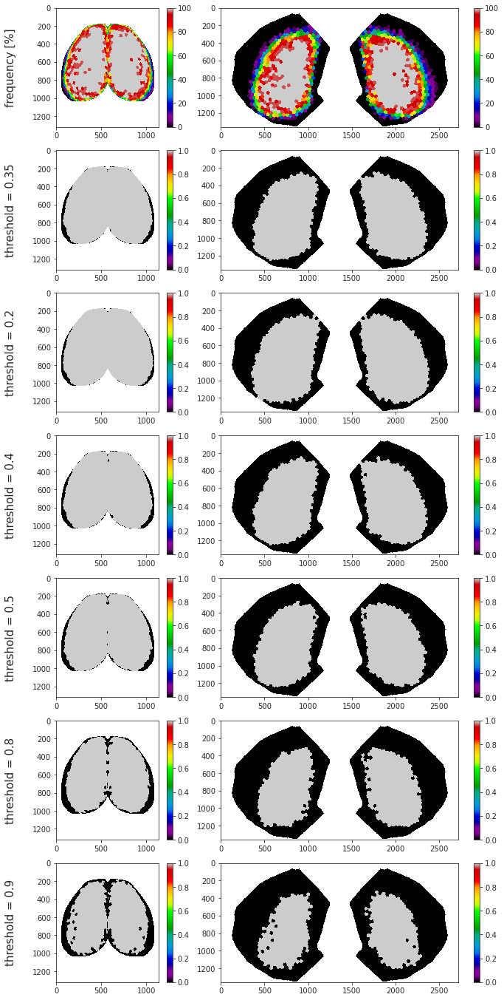

In [79]:
accepted

{
    84: 0.5,
    88: 0.7333333333333333,
    93: 0.8666666666666667,
    94: 0.7,
    96: 0.9,
    104: 0.8,
    105: 0.8666666666666667,
    107: 0.6333333333333333,
    109: 0.8666666666666667,
    111: 0.9333333333333333,
    116: 0.9,
    118: 0.9666666666666667,
    120: 0.7666666666666667,
    121: 0.6666666666666666,
    122: 0.8666666666666667,
    123: 0.9666666666666667,
    126: 0.7,
    129: 1.0,
    130: 0.9,
    133: 0.8666666666666667,
    135: 1.0,
    137: 0.9666666666666667,
    140: 0.9333333333333333,
    141: 0.7,
    143: 1.0,
    146: 0.9333333333333333,
    149: 0.9666666666666667,
    151: 1.0,
    153: 0.9333333333333333,
    156: 1.0,
    157: 0.6333333333333333,
    160: 0.5,
    161: 1.0,
    162: 0.9,
    164: 0.7666666666666667,
    165: 1.0,
    166: 0.9,
    167: 0.9333333333333333,
    174: 0.9666666666666667,
    177: 1.0,
    179: 0.9666666666666667,
    182: 1.0,
    183: 1.0,
    184: 0.5,
    186: 0.7666666666666667,
    188: 0.9666666666666667,
    190: 0.8666666666666667,
    191: 0.9333333333333333,
    194: 0.9666666666666667,
    196: 0.9666666666666667,
    197: 1.0,
    201: 1.0,
    206: 0.5333333333333333,
    207: 1.0,
    209: 1.0,
    210: 1.0,
    211: 0.8,
    212: 1.0,
    213: 0.9,
    216: 0.8333333333333334,
    218: 0.9666666666666667,
    219: 1.0,
    221: 1.0,
    226: 1.0,
    230: 1.0,
    232: 1.0,
    234: 1.0,
    235: 1.0,
    236: 0.7666666666666667,
    238: 0.7666666666666667,
    239: 1.0,
    241: 0.9666666666666667,
    242: 0.9,
    243: 0.8666666666666667,
    245: 1.0,
    247: 1.0,
    248: 1.0,
    252: 0.26666666666666666,
    253: 0.7666666666666667,
    254: 1.0,
    255: 1.0,
    258: 1.0,
    262: 0.5333333333333333,
    264: 1.0,
    265: 0.9,
    266: 1.0,
    268: 0.9,
    269: 1.0,
    270: 1.0,
    273: 1.0,
    275: 0.9666666666666667,
    276: 0.6666666666666666,
    277: 1.0,
    280: 1.0,
    281: 1.0,
    284: 0.8666666666666667,
    285: 0.8,
    289: 1.0,
    290: 1.0,
    291: 0.9333333333333333,
    292: 0.9666666666666667,
    295: 0.9666666666666667,
    296: 0.9666666666666667,
    297: 1.0,
    300: 1.0,
    301: 1.0,
    303: 0.9,
    307: 0.7333333333333333,
    309: 1.0,
    311: 1.0,
    312: 1.0,
    313: 0.43333333333333335,
    317: 0.4,
    318: 1.0,
    319: 0.8,
    320: 1.0,
    321: 1.0,
    322: 1.0,
    323: 1.0,
    324: 1.0,
    327: 1.0,
    329: 1.0,
    331: 0.8666666666666667,
    333: 1.0,
    339: 1.0,
    341: 1.0,
    342: 1.0,
    343: 1.0,
    344: 0.6333333333333333,
    345: 0.9,
    346: 1.0,
    347: 1.0,
    350: 0.5666666666666667,
    351: 1.0,
    352: 0.9,
    354: 1.0,
    355: 0.8,
    357: 1.0,
    361: 1.0,
    363: 1.0,
    365: 0.8666666666666667,
    367: 1.0,
    368: 0.9333333333333333,
    370: 0.8666666666666667,
    371: 1.0,
    372: 0.9666666666666667,
    373: 0.9666666666666667,
    374: 1.0,
    377: 1.0,
    378: 0.5,
    379: 1.0,
    381: 0.9,
    382: 1.0,
    387: 1.0,
    389: 0.3,
    390: 0.8666666666666667,
    391: 1.0,
    392: 0.8666666666666667,
    393: 1.0,
    397: 0.9333333333333333,
    399: 1.0,
    400: 1.0,
    401: 1.0,
    403: 1.0,
    405: 1.0,
    406: 1.0,
    407: 1.0,
    409: 1.0,
    410: 0.6666666666666666,
    411: 0.8333333333333334,
    412: 0.9666666666666667,
    417: 0.9333333333333333,
    418: 0.3,
    419: 1.0,
    420: 1.0,
    421: 1.0,
    422: 0.5,
    423: 1.0,
    425: 1.0,
    428: 1.0,
    429: 1.0,
    430: 0.9666666666666667,
    431: 1.0,
    434: 1.0,
    435: 0.9,
    436: 1.0,
    437: 0.6,
    440: 0.8666666666666667,
    441: 0.9666666666666667,
    442: 0.9666666666666667,
    443: 1.0,
    446: 0.8,
    447: 0.9666666666666667,
    448: 0.9666666666666667,
    451: 0.8666666666666667,
    452: 1.0,
    454: 1.0,
    455: 1.0,
    459: 0.9666666666666667,
    460: 0.5,
    461: 1.0,
    462: 0.8666666666666667,
    463: 0.9666666666666667,
    465: 1.0,
    466: 1.0,
    467: 1.0,
    468: 1.0,
    471: 1.0,
    473: 

In [80]:
len(accepted), len(freq)

(926, 1300)

In [81]:
acc = sorted(accepted)
acc

[
    58,
    59,
    70,
    71,
    74,
    78,
    79,
    82,
    83,
    84,
    85,
    88,
    89,
    91,
    93,
    94,
    95,
    96,
    99,
    102,
    104,
    105,
    107,
    109,
    111,
    114,
    116,
    118,
    119,
    120,
    121,
    122,
    123,
    126,
    129,
    130,
    133,
    135,
    137,
    138,
    139,
    140,
    141,
    143,
    146,
    149,
    151,
    153,
    156,
    157,
    158,
    159,
    160,
    161,
    162,
    164,
    165,
    166,
    167,
    171,
    174,
    177,
    178,
    179,
    182,
    183,
    184,
    186,
    188,
    189,
    190,
    191,
    194,
    196,
    197,
    201,
    206,
    207,
    209,
    210,
    211,
    212,
    213,
    214,
    216,
    217,
    218,
    219,
    221,
    226,
    230,
    231,
    232,
    233,
    234,
    235,
    236,
    238,
    239,
    241,
    242,
    243,
    245,
    247,
    248,
    252,
    253,
    254,
    255,
    258,
    261,
    262,
    264,
    265,
    266,
    268,
    269,
    270,
    273,
    275,
    276,
    277,
    280,
    281,
    283,
    284,
    285,
    289,
    290,
    291,
    292,
    295,
    296,
    297,
    300,
    301,
    303,
    307,
    309,
    310,
    311,
    312,
    313,
    317,
    318,
    319,
    320,
    321,
    322,
    323,
    324,
    327,
    329,
    331,
    333,
    335,
    339,
    341,
    342,
    343,
    344,
    345,
    346,
    347,
    350,
    351,
    352,
    354,
    355,
    357,
    361,
    363,
    364,
    365,
    367,
    368,
    370,
    371,
    372,
    373,
    374,
    377,
    378,
    379,
    381,
    382,
    383,
    387,
    388,
    389,
    390,
    391,
    392,
    393,
    397,
    399,
    400,
    401,
    403,
    405,
    406,
    407,
    409,
    410,
    411,
    412,
    417,
    418,
    419,
    420,
    421,
    422,
    423,
    425,
    428,
    429,
    430,
    431,
    434,
    435,
    436,
    437,
    440,
    441,
    442,
    443,
    446,
    447,
    448,
    451,
    452,
    453,
    454,
    455,
    459,
    460,
    461,
    462,
    463,
    465,
    466,
    467,
    468,
    471,
    473,
    474,
    475,
    476,
    477,
    478,
    480,
    484,
    485,
    486,
    488,
    489,
    491,
    493,
    494,
    495,
    496,
    497,
    498,
    499,
    500,
    501,
    503,
    504,
    505,
    509,
    511,
    512,
    513,
    516,
    517,
    518,
    520,
    521,
    522,
    523,
    525,
    526,
    527,
    528,
    529,
    530,
    531,
    532,
    533,
    539,
    540,
    542,
    543,
    544,
    545,
    546,
    547,
    548,
    549,
    551,
    552,
    553,
    554,
    555,
    556,
    557,
    559,
    562,
    564,
    565,
    566,
    569,
    570,
    571,
    572,
    573,
    574,
    575,
    576,
    578,
    579,
    580,
    581,
    582,
    583,
    584,
    588,
    590,
    591,
    593,
    594,
    595,
    596,
    598,
    599,
    601,
    602,
    603,
    604,
    606,
    607,
    609,
    610,
    611,
    612,
    613,
    615,
    616,
    617,
    618,
    619,
    620,
    623,
    625,
    626,
    627,
    629,
    630,
    632,
    633,
    634,
    635,
    636,
    638,
    639,
    640,
    642,
    644,
    646,
    648,
    649,
    651,
    652,
    653,
    654,
    655,
    656,
    657,
    659,
    662,
    663,
    664,
    665,
    666,
    667,
    669,
    670,
    672,
    673,
    674,
    675,
    677,
    678,
    679,
    680,
    681,
    682,
    684,
    685,
    686,
    688,
    689,
    690,
    692,
    694,
    695,
    696,
    697,
    699,
    700,
    701,
    702,
    703,
    704,
    705,
    706,
    707,
    711,
    712,
    714,
    715,
    716,
    717,
    718,
    719,
    720,
    721,
    722,
    723,
    724,
    728,
    729,
    730,
    731,
    732,
    733,
    734,
    736,
    738,
    740,
    743,
    1310,
    1334,
    1351,
    1358,
    1402

In [83]:
acc_comp = mice.parcel.complement(acc)
len(acc_comp)

970

<matplotlib.image.AxesImage object at 0x7e7cc9d89c40>

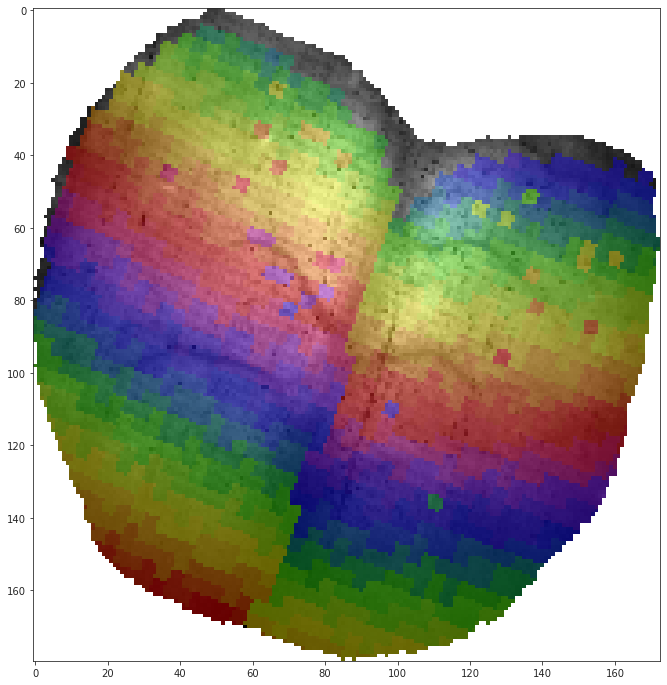

In [33]:
plt.figure(figsize=(15, 12))
plt.imshow(np.ma.masked_where(~mask_tr, ref_tr), cmap='Greys_r')
plt.imshow(np.ma.masked_where(~roi_tr.astype(bool), roi_tr), alpha=0.4, cmap='prism')

## Why are some layer 1 stuff? (new viz)

In [34]:
hcl = mice.parcel.decode(regions2d)

In [35]:
lay0 = regions2d[hcl[:, -1] == 0]
lay1 = regions2d[hcl[:, -1] == 1]

<matplotlib.image.AxesImage object at 0x7e7c57d15910>

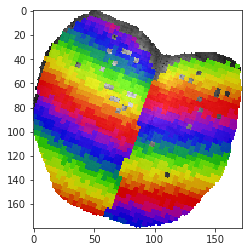

In [36]:
plt.imshow(np.ma.masked_where(~mask_tr, ref_tr), cmap='Greys_r')
plt.imshow(np.ma.masked_where(~np.isin(roi_tr, lay0), roi_tr), alpha=0.8, cmap='prism')

<matplotlib.image.AxesImage object at 0x7e7c57839ac0>

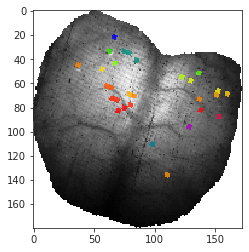

In [37]:
plt.imshow(np.ma.masked_where(~mask_tr, ref_tr), cmap='Greys_r')
plt.imshow(np.ma.masked_where(~np.isin(roi_tr, lay1), roi_tr), alpha=0.8, cmap='prism')

In [38]:
hcl_lay1 = mice.parcel.decode(lay1)
hcl_lay1[:, -1] = 0
lay1_to_0 = mice.parcel.encode(hcl_lay1)

<matplotlib.image.AxesImage object at 0x7e7c4f606fd0>

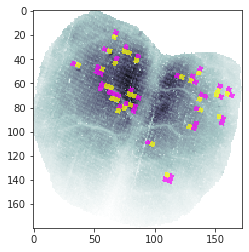

In [65]:
plt.imshow(np.ma.masked_where(~mask_tr, ref_tr), cmap='bone_r')
plt.imshow(np.ma.masked_where(~np.isin(roi_tr, lay1), roi_tr).astype(bool), alpha=0.7, cmap='autumn_r')
plt.imshow(np.ma.masked_where(~np.isin(roi_tr, lay1_to_0), roi_tr).astype(bool), alpha=0.7, cmap='cool_r')

<matplotlib.image.AxesImage object at 0x7e7c5758bf70>

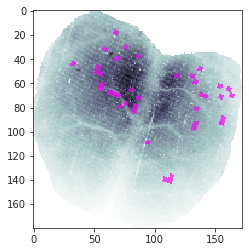

In [66]:
plt.imshow(np.ma.masked_where(~mask_tr, ref_tr), cmap='bone_r')
# plt.imshow(np.ma.masked_where(~np.isin(roi_tr, lay1), roi_tr).astype(bool), alpha=0.7, cmap='autumn_r')
plt.imshow(np.ma.masked_where(~np.isin(roi_tr, lay1_to_0), roi_tr).astype(bool), alpha=0.7, cmap='cool_r')

<matplotlib.image.AxesImage object at 0x7e7c57f98be0>

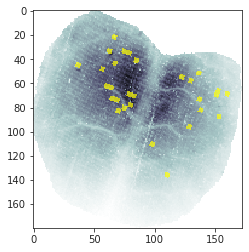

In [67]:
plt.imshow(np.ma.masked_where(~mask_tr, ref_tr), cmap='bone_r')
plt.imshow(np.ma.masked_where(~np.isin(roi_tr, lay1), roi_tr).astype(bool), alpha=0.7, cmap='autumn_r')
# plt.imshow(np.ma.masked_where(~np.isin(roi_tr, lay1_to_0), roi_tr).astype(bool), alpha=0.7, cmap='cool_r')